The Land Surface Climate in the Regional Arctic System Model
=====
**Joe Hamman, Bart Nijssen**

*Department of Civil and Environmental Engineering, University of Washington, Seattle, WA, USA*

**Dennis Lettenmier**

*Department of Geography, University of California Los Angeles, Los Angeles, CA, USA*

**Wieslaw Maslowski, …others…**

*Department of Oceanography, Naval Postgraduate School, Monterey, CA, USA*

## Abstract:
The Arctic region is expected to experience disproportionately severe impacts due to climate change, affecting sea ice, seasonal snow cover, streamflow, permafrost, glaciers, and ice sheets as well as terrestrial and aquatic ecosystems.  Through the use of the Regional Arctic System Model (RASM), a fully coupled regional earth system model, we aim to better understand how changes in these processes may prompt non-linear responses and feedbacks throughout the Arctic region climate system.  The net effect of these feedbacks is not easily understood without the use of coupled earth system models that allow us to evaluate the interactions between components of the climate system; determine the extent, magnitude, and sign of complex feedback processes; and to project the climate system’s response to future predictions.  RASM is a high resolution, regional, coupled atmosphere - land - sea ice - ocean model that uses the Community Earth System Model (CESM) coupling infrastructure over a Pan-Arctic domain. RASM is composed of the Weather Research and Forecasting (WRF) atmospheric model, the Variable Infiltration Capacity (VIC) hydrology model, the RVIC streamflow routing model, the Parallel Ocean Program (POP) model and the Los Alamos Sea Ice model (CICE).  We evaluate RASM’s abilities to capture key features of the land surface climate and hydrological cycle over the recent decades (1979-2009) through comparisons with uncoupled simulations, reanalysis data sets, satellite measurements and in-situ observations. Of particular interest are the model’s ability to capture diurnal, seasonal, and interannual variations in hydrological fluxes and states and the interaction between model components.

This notebook contains the code and figures used in this paper. 


In [1]:
%matplotlib inline

In [2]:
# Reguired libraries
import os
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from mpl_toolkits.basemap import cm as basemap_cm
import seaborn as sns
from collections import OrderedDict
from netCDF4 import num2date
from scipy.stats import ranksums, ttest_ind
from scipy.spatial import ConvexHull
from datetime import datetime
from calendar import month_abbr, month_name
from netCDF4 import date2num, num2date

# For temporary display of existing figures
from IPython.display import Image

# RASM lib plotting utilities
from rasmlib.calendar import dpm
from rasmlib.analysis.climatology import season_mean, annual_mean
from rasmlib.analysis.plotting import cmap_discretize, sub_plot_pcolor, projections, default_map, make_bmap, seasons

sns.set_style("white")

# Set some general plotting values
fontsize = 7
dpi = 200 # set to 900 for final publication
mpl.rc('font', family='sans-serif') 
mpl.rc('font', serif='Myriad Pro') 
mpl.rc('text', usetex='false') 
mpl.rcParams.update({'font.size': fontsize})
mpl.rcParams['mathtext.default'] = 'sf'
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['pdf.fonttype'] = 42

fill_color = (0.9, 0.9, 0.9)


samin, samax = -11, 11

In [3]:
# daily = True
ncfiles = {}
# Grid and domain files
ncfiles['rasm_domain'] = '/raid2/jhamman/projects/RASM/data/inputdata/CESM/share/domains/domain.lnd.wr50a_ar9v4.100920.nc'
ncfiles['rasm_masks'] = '/raid2/jhamman/projects/RASM/data/inputdata/RASM_VICRVIC_GRID_MASKS_AND_METRICS.nc'

# RASM run files used in this analysis
# # daily
# if daily:
#     ncfiles['rasm_era_daily_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RBRcaaa01a/lnd/daily_mean_timeseries/R1003RBRcaaa01a.vic.hdm.19790901-20131231.nc'
#     ncfiles['rasm_cfsr_daily_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RBRcaaa01b/lnd/daily_mean_timeseries/R1003RBRcaaa01b.vic.hdm.19790901-20091231.nc'
#     ncfiles['rasm_offline_daily_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RIRbaaa01e/lnd/daily_mean_timeseries/R1003RIRbaaa01e.vic.hdm.19790901-20080227.nc'
ncfiles['rasm_era_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RBRcaaa01a/lnd/monthly_mean_timeseries/R1003RBRcaaa01a.vic.hmm.197909-201412.nc'
ncfiles['rasm_cfsr_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RBRcaaa01b/lnd/monthly_mean_timeseries/R1003RBRcaaa01b.vic.hmm.197909-200912.nc'
ncfiles['rasm_offline_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RIRbaaa01e/lnd/monthly_mean_timeseries/R1003RIRbaaa01e.vic.hmm.197909-200801.nc'
ncfiles['rasm_offline_alb_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/processed/R1003RIRbvba01e/lnd/monthly_mean_timeseries/R1003RIRbvba01e.vic.hmm.197909-200708.nc'

# Comparison datasets

# Spatio-temporal - monthly
ncfiles['era_monthly_ts1'] = '/raid2/jhamman/projects/RASM/data/compare/era-interim/wrf-197909-201212.era_i.nc'
ncfiles['era_monthly_ts2'] = '/raid2/jhamman/projects/RASM/data/compare/era-interim/met_em-197909-201212.nc'
ncfiles['era_monthly_ts3'] = '/raid2/jhamman/projects/RASM/data/compare/era-interim/era_water_vars.1979-2014.nc'
ncfiles['merra_monthly_ts1'] = '/raid2/jhamman/projects/RASM/data/compare/MERRA/monthly/MERRA.prod.assim.tavgM_2d_lnd_Nx.197901-201312.SUB.wr50a.nc'
ncfiles['merra_monthly_ts2'] = '/raid2/jhamman/projects/RASM/data/compare/MERRA/monthly/MERRA.prod.assim.tavgM_2d_rad_slv_Nx.1979-2015.SUB.wr50a.nc'
ncfiles['cru_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/cru_ts3.21/cru_ts3.21.1901.2012_wr50a.nc'
ncfiles['sheffield_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/sheffield2006/sheffield2006_wr50a.mm.nc'
ncfiles['adam_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/adam2003/adam2003_wr50a.mm.nc'
ncfiles['gfluxnet_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/GlobalFluxNet/GlobalFluxNet.wr50a.1982-2011.nc'
ncfiles['globalbedo_monthly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/GlobAlbedo/GlobAlbedo.1998-2011.mosaic.wr50a.nc'
# Spatio-temporal - weekly
# ncfiles['nsidc_weekly_ts'] = '/raid2/jhamman/projects/RASM/data/compare/nsidc_snowcover/nsidc_snowcover_V4_wr50a.nc'

# Spatio-temporal - daily
# if daily:
#     ncfiles['merra_daily_ts'] = '/raid2/jhamman/projects/RASM/data/compare/MERRA/daily/MERRA.prod.assim.tavg1_2d_lnd_Nx.1981-2010.SUB.wr50a.nc'

# Timeseries - subdaily

start='1989-09-01'
end='2014-08-31'

simple_start = '1980-01-01'
simple_end = '2014-12-31'

calendars = {}
calendars['$NSIDC$'] = 'standard'
calendars['$RASM_{ERA}$'] = 'noleap'
calendars['$RASM_{CFSR}$'] = 'noleap'
calendars['$VIC_{S2006}$'] = 'standard'
calendars['$MERRA$'] = 'standard'
calendars['$ERA$'] = 'standard'

In [4]:
ncdata = {}
for k, v in ncfiles.items():
    try:
        print(k)
        ncdata[k] = xr.open_dataset(v)
    except:
        print(k, '<---unable to decode time!', )
        ncdata[k] = xr.open_dataset(v, decode_times=False)
ncdata['gfluxnet_monthly_ts']['time'] = pd.date_range('1982-01-01', '2011-12-01', freq='MS')

# Rename variables in datasets as necessary
name_dicts = {'era_monthly_ts1': {'rsus': 'Swup',
                                  'rsds': 'Swin',
                                  'rlus': 'Lwup',
                                  'rlds': 'Lwin',
                                  'hfss': 'Senht',
                                  'hfls': 'Latht',
                                  'snow_depth': 'Swq',
                                  'precip_tot': 'Precipitation',
                                  'LW_deac_net': 'Lwnet',
                                  'SW_deac_net': 'Swnet',
                                  'west_east': 'x',
                                  'south_north': 'y'},
              'era_monthly_ts2': {'T_2m': 'Tair',
                                  'west_east': 'x',
                                  'south_north': 'y'},
              'era_monthly_ts3': {'tp': 'Precipitation',
                                  'e': 'Evap',
                                  'ro': 'Runoff'},
              'sheffield_monthly_ts':{'tas': 'Tair',
                                      'prcp': 'Precipitation'},
              'merra_monthly_ts1': {'prectot': 'Precipitation',
                                    'runoff': 'Runoff',
                                    'baseflow': 'Baseflow',
                                    'shland': 'Senht',
                                    'lhland': 'Latht',
                                    'snomas': 'Swq',
                                    'evland': 'Evap',
                                    'lwland': 'Lwnet',
                                    'swland': 'Swnet'},
              'merra_monthly_ts2': {'lwgem': 'Lwup',
                                    'swgdn': 'Swin',
                                    'swgnt': 'Swnet',
                                    'lwgnt': 'Lwnet',
                                    't2m': 'Tair',
                                   },
              'cru_monthly_ts': {'tmp': 'Tair',
                                 'pre': 'Precipitation'},
              'adam_monthly_ts': {'Precip': 'Precipitation'},
              'gfluxnet_monthly_ts': {'EnsembleHcor_May12': 'Senht',
                                      'EnsembleLEcor_May12': 'Latht'},
              'globalbedo_monthly_ts': {'albedo': 'calc_albedo'}
              }

for k, v in ncdata.items():
    if k in name_dicts:
        print(k)
        v.rename(name_dicts[k], inplace=True)

rasm_cfsr_monthly_ts
rasm_offline_alb_monthly_ts
rasm_masks
globalbedo_monthly_ts
adam_monthly_ts
gfluxnet_monthly_ts
gfluxnet_monthly_ts <---unable to decode time!
era_monthly_ts2
era_monthly_ts1
merra_monthly_ts1
rasm_domain
sheffield_monthly_ts
rasm_era_monthly_ts
cru_monthly_ts
merra_monthly_ts2
rasm_offline_monthly_ts
era_monthly_ts3
adam_monthly_ts
gfluxnet_monthly_ts
era_monthly_ts2
globalbedo_monthly_ts
merra_monthly_ts1
sheffield_monthly_ts
cru_monthly_ts
merra_monthly_ts2
era_monthly_ts3
era_monthly_ts1


In [5]:
re = 6.37122e6
# Add variables or adjust units of datasets if ncessary

# RASM
ncdata['rasm_domain']['area'] *= re * re  # m2
for r in ['rasm_era_monthly_ts', 'rasm_cfsr_monthly_ts', 'rasm_offline_monthly_ts', 'rasm_offline_alb_monthly_ts']:
    ncdata[r]['calc_albedo'] = 1 - (ncdata[r]['Swnet'] / ncdata[r]['Swin'])
    ncdata[r]['Swup'] = ncdata[r]['Swin'] - ncdata[r]['Swnet']
    ncdata[r]['Lwup'] = ncdata[r]['Lwin'] - ncdata[r]['Lwnet']
    ncdata[r]['runoff_tot'] = ncdata[r]['Runoff'] + ncdata[r]['Baseflow']
    ncdata[r]['Radnet'] = ncdata[r]['Swnet'] + ncdata[r]['Lwnet']
    ncdata[r]['Radin'] = ncdata[r]['Swin'] + ncdata[r]['Lwin']
    ncdata[r]['runoff_ratio'] = ncdata[r]['runoff_tot'] / ncdata[r]['Precipitation']
    ncdata[r]['bowen_ratio'] = ncdata[r]['Senht'] / ncdata[r]['Latht']
    ncdata[r]['evap_frac'] = ncdata[r]['Latht'] / (ncdata[r]['Latht'] + ncdata[r]['Senht'])
    ncdata[r]['P-E'] = ncdata[r]['Precipitation'] - ncdata[r]['Evap']
    
# sheffield
ncdata['sheffield_monthly_ts']['Tair'] -= 273.15
ncdata['sheffield_monthly_ts']['Precipitation'] *= 86400 

# ERA-Interim
ncdata['era_monthly_ts1']['calc_albedo'] = ncdata['era_monthly_ts1']['Swup'] / ncdata['era_monthly_ts1']['Swin']
ncdata['era_monthly_ts1']['Swnet'] = ncdata['era_monthly_ts1']['Swin'] - ncdata['era_monthly_ts1']['Swup']
ncdata['era_monthly_ts1']['Lwnet'] = ncdata['era_monthly_ts1']['Lwin'] - ncdata['era_monthly_ts1']['Lwup']
ncdata['era_monthly_ts1']['Radnet'] = ncdata['era_monthly_ts1']['Swnet'] + ncdata['era_monthly_ts1']['Lwnet']
ncdata['era_monthly_ts1']['Radin'] = ncdata['era_monthly_ts1']['Swin'] + ncdata['era_monthly_ts1']['Lwin']
ncdata['era_monthly_ts1']['bowen_ratio'] = ncdata['era_monthly_ts1']['Senht'] / ncdata['era_monthly_ts1']['Latht']
ncdata['era_monthly_ts1']['evap_frac'] = 1 / (1 + ncdata['era_monthly_ts1']['bowen_ratio'])
for var in ('Runoff', 'Precipitation'):
    ncdata['era_monthly_ts3'][var] *= 1000.
ncdata['era_monthly_ts3']['Evap'] *= -1000.
ncdata['era_monthly_ts3'] = ncdata['era_monthly_ts3'].resample('MS', how='mean', dim='time')
ncdata['era_monthly_ts3']['runoff_tot'] = ncdata['era_monthly_ts3']['Runoff']
ncdata['era_monthly_ts3']['runoff_ratio'] = ncdata['era_monthly_ts3']['runoff_tot'] / ncdata['era_monthly_ts3']['Precipitation']
ncdata['era_monthly_ts3']['P-E'] = ncdata['era_monthly_ts3']['Precipitation'] - ncdata['era_monthly_ts3']['Evap']
ncdata['era_monthly_ts3'].drop(['nv4', 'xc_bnds', 'yc_bnds'])


# MERRA
# fix a few timesteps that are out of place
ncdata['merra_monthly_ts1'].load()
inds = ncdata['merra_monthly_ts1']['time'].argsort()
ncdata['merra_monthly_ts1'] = ncdata['merra_monthly_ts1'].isel(time=inds).sel(time=slice(start, end))

ncdata['merra_monthly_ts1']['Precipitation'] *= 86400 
ncdata['merra_monthly_ts1']['Runoff'] *= 86400 
ncdata['merra_monthly_ts1']['Baseflow'] *= 86400 
ncdata['merra_monthly_ts1']['Evap'] *= 86400 
ncdata['merra_monthly_ts1']['runoff_tot'] = ncdata['merra_monthly_ts1']['Runoff'] + ncdata['merra_monthly_ts1']['Baseflow']
ncdata['merra_monthly_ts1']['runoff_ratio'] = ncdata['merra_monthly_ts1']['runoff_tot'] / ncdata['merra_monthly_ts1']['Precipitation']
ncdata['merra_monthly_ts1']['Radnet'] = ncdata['merra_monthly_ts1']['Lwnet'] + ncdata['merra_monthly_ts1']['Swnet']
ncdata['merra_monthly_ts1']['bowen_ratio'] = ncdata['merra_monthly_ts1']['Senht'] / ncdata['merra_monthly_ts1']['Latht']
ncdata['merra_monthly_ts1']['evap_frac'] = 1 / (1 + ncdata['merra_monthly_ts1']['bowen_ratio'])
ncdata['merra_monthly_ts1']['P-E'] = ncdata['merra_monthly_ts1']['Precipitation'] - ncdata['merra_monthly_ts1']['Evap']
ncdata['merra_monthly_ts2']['calc_albedo'] = 1 - (ncdata['merra_monthly_ts2']['Swnet'] / ncdata['merra_monthly_ts2']['Swin'])
ncdata['merra_monthly_ts2']['Lwin'] = ncdata['merra_monthly_ts2']['Lwup'] + ncdata['merra_monthly_ts2']['Lwnet']
ncdata['merra_monthly_ts2']['Swup'] = ncdata['merra_monthly_ts2']['Swin'] - ncdata['merra_monthly_ts2']['Swnet']
ncdata['merra_monthly_ts2']['Radin'] = ncdata['merra_monthly_ts2']['Swin'] + ncdata['merra_monthly_ts2']['Lwin']
ncdata['merra_monthly_ts2']['Tair'] -= 273.15

# Global Fluxnet
ncdata['gfluxnet_monthly_ts']['Senht'] *= (1.0e6) / 86400.  # "MJoule*m-2*d-1" --> "W*m-2"
ncdata['gfluxnet_monthly_ts']['Latht'] *= (1.0e6) / 86400.  # "MJoule*m-2*d-1" --> "W*m-2"
ncdata['gfluxnet_monthly_ts']['bowen_ratio'] = ncdata['gfluxnet_monthly_ts']['Senht'] / ncdata['gfluxnet_monthly_ts']['Latht']
ncdata['gfluxnet_monthly_ts']['evap_frac'] = 1 / (1 + ncdata['gfluxnet_monthly_ts']['bowen_ratio'])

In [6]:
swin_thresh = 25.
# masked_albedo = {}
albedo_t_slice = slice('1998-01-01', '2007-12-31')
era_sw_in = ncdata['era_monthly_ts1']['Swin'].sel(time=albedo_t_slice)
invalid = era_sw_in.values < swin_thresh
for r in ['rasm_era_monthly_ts', 'rasm_offline_monthly_ts', 'era_monthly_ts1', 'merra_monthly_ts2', 'globalbedo_monthly_ts']:
    temp = ncdata[r]['calc_albedo'].sel(time=albedo_t_slice)
    temp.values[invalid] = np.nan
#     ncdata[r]['calc_albedo'] = temp
#     ncdata[r]['calc_albedo'][:, 29, 179].to_series()[albedo_t_slice].plot(label=r)
# plt.legend()

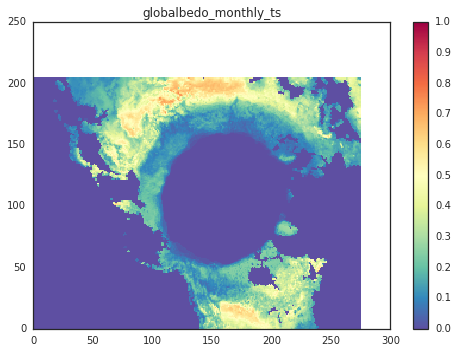

In [7]:
sm = season_mean(temp, calendar='noleap')
plt.pcolormesh(np.ma.masked_invalid(sm.sel(season='DJF').values), cmap='Spectral_r', vmin=0, vmax=1)
plt.title(r)
plt.colorbar()

In [8]:
# Setup rasmlib plotting
wr50a_map = make_bmap(projection=projections['wr50a'],
                      lons=ncdata['rasm_domain']['xc'].values,
                      lats=ncdata['rasm_domain']['yc'].values)
ncdata['rasm_masks'] = xr.open_dataset(ncfiles['rasm_masks'])
spatial_plot_mask = ncdata['rasm_masks']['mask_active_land'].values < 0.9

In [9]:
pop_masks = xr.open_dataset('/raid2/jhamman/projects/RASM/data/inputdata/RASM_POPCICE_GRID_MASKS_AND_METRICS.nc')
wrf_masks = xr.open_dataset('/raid2/jhamman/projects/RASM/data/inputdata/RASM_WRFVIC_GRID_MASKS_AND_METRICS.nc')

ar9v4_map = make_bmap(projection=projections['wr50a'],
                      lons=pop_masks['longitude'].values,
                      lats=pop_masks['latitude'].values)


In [10]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
def colorbar_index(ncolors, cmap, ticklabels=None):
    cmap = cmap_discretize_2(cmap, ncolors)
    mappable = cm.ScalarMappable(cmap=cmap)
    mappable.set_array([])
    mappable.set_clim(-0.5, ncolors+0.5)
    colorbar = plt.colorbar(mappable, shrink=cbar_shrink, pad=0.01)
    colorbar.set_ticks(np.linspace(0, ncolors, ncolors))
    if ticklabels is None:
        colorbar.set_ticklabels(range(ncolors))
    else:
        colorbar.set_ticklabels(ticklabels)
    return colorbar

def cmap_discretize_2(cmap, N):
    """Return a discrete colormap from the continuous colormap cmap.

        cmap: colormap instance, eg. cm.jet. 
        N: number of colors.

    Example
        x = resize(arange(100), (5,100))
        djet = cmap_discretize(cm.jet, 5)
        imshow(x, cmap=djet)
    """

    if type(cmap) == str:
        cmap = plt.get_cmap(cmap)
    colors_i = np.concatenate((np.linspace(0, 1., N), (0.,0.,0.,0.)))
    colors_rgba = cmap(colors_i)
    indices = np.linspace(0, 1., N+1)
    cdict = {}
    for ki,key in enumerate(('red','green','blue')):
        cdict[key] = [ (indices[i], colors_rgba[i-1,ki], colors_rgba[i,ki])
                       for i in range(N+1) ]
    # Return colormap object.
    return mcolors.LinearSegmentedColormap(cmap.name + "_%d"%N, cdict, 1024)

In [11]:
def plot2(plot_data,
          cmap='Spectral_r',
          amap='RdBu_r',
          ylabels=None,
          titles=('DJF', 'MAM', 'JJA', 'SON', 'ANNUAL'),
          suptitle=None,
          cbar_label='',
          abar_label='',
          vmin=None,
          vmax=None,
          amin=None,
          amax=None,
          cbar_extend='neither',
          abar_extend='neither',
          stack_cbars=False,
          map_obj=default_map,
          anom_hatching=None):
    """"""
    ncols = 5
    nrows = 3
    
    # Make sure plot_data is the right size
    grid_shape = map_obj.xi.shape
    assert(map_obj.xi.shape == map_obj.yi.shape)
    assert(map_obj.xi.shape == plot_data.shape[2:])
    assert(plot_data.shape[:2] == (nrows, ncols))
    
    # set data ranges
    if vmin is None:
        vmin = plot_data[:2].min()
    if vmax is None:
        vmax = plot_data[:2].max()
    if amin is None:
        amin = plot_data[2].min()
    if amax is None:
        amax = plot_data[2].max()
    
    # Set colorbar norms and ticks
    assert(type(cmap) == str)
    cn = 10
    cmap = cmap_discretize(cmap, n_colors=cn)
    cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cticks = np.linspace(vmin, vmax, num=cn + 1)
    assert(type(amap) == str)
    an = 10
    amap = cmap_discretize(amap, n_colors=an)
    anorm = mpl.colors.Normalize(vmin=amin, vmax=amax)
    aticks = np.linspace(amin, amax, num=an + 1)

    if abar_label and not cbar_label:
        cbar_label = abar_label
    
    # Copy colormap and data ranges to iterables
    cmaps = (cmap, cmap, amap)
    vmins = (vmin, vmin, amin)
    vmaxs = (vmax, vmax, amax)

    # Make the plot
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(11, 5.5))
    for (i, j), ax in np.ndenumerate(axes):
        plt.sca(ax)
        sub_plot_pcolor(plot_data[i, j],
                        cmap=cmaps[i],
                        cbar=None,
                        vmin=vmins[i],
                        vmax=vmaxs[i],
                        map_obj=map_obj,
                        ax=ax)
        if i == 0 and titles is not None:
            ax.set_title(titles[j])
        if j == 0 and ylabels is not None:
            ax.set_ylabel(ylabels[i])
        if i == nrows - 1 and anom_hatching is not None:
            map_obj.m.contourf(map_obj.xi, map_obj.yi,
                               100 * (anom_hatching[j]),
                               [0,5],
                               cmap=plt.get_cmap('gray'),
                               hatches=['....', None],
                               alpha=0,
                               ax=ax)
            
    # Add figure title
    if suptitle is not None:
        fig.suptitle(suptitle, fontsize=16, fontweight='roman', y=1.02)
    plt.tight_layout()

    # Color bars
    if stack_cbars:
        ax1 = fig.add_axes([0.995, 0.37, 0.015, 0.54])
        cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=cnorm,
                                        orientation='vertical',
                                        extend=cbar_extend,
                                        ticks=cticks)
        ax2 = fig.add_axes([0.995, 0.08, 0.015, 0.23])
        cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=amap, norm=anorm,
                                        orientation='vertical',
                                        extend=abar_extend,
                                        ticks=aticks,
                                        extendfrac=0.12)
        if cbar_label:
            cb1.set_label(cbar_label, rotation=90)
            cb2.set_label(abar_label, rotation=90)
        
    else:
        ax1 = fig.add_axes([0.995, 0.08, 0.015, 0.83])
        cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=cnorm,
                                        orientation='vertical',
                                        extend=cbar_extend,
                                        ticks=cticks)
        ax2 = fig.add_axes([1.05, 0.08, 0.015, 0.83])
        cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=amap, norm=anorm,
                                        orientation='vertical',
                                        extend=abar_extend,
                                        ticks=aticks)
        if cbar_label:
            cb1.set_label(cbar_label, y=0.005, labelpad=-10, rotation=0)
        if abar_label:
            cb2.set_label(abar_label, y=0.005, labelpad=-10, rotation=0)
    
    return fig, axes

In [12]:
def plot_n(monthly_means, 
           annual_means=False,
           cmap='Spectral_r',
           amap='RdBu_r',
           vmin=None,
           vmax=None,
           amin=None,
           amax=None,
           map_obj=wr50a_map,
           cbar_label='',
           abar_label='',
           cbar_extend='neither',
           abar_extend='neither',   
           mask=None,
           mask_sig=0.01,
           standarize=False):

    ''''''

    nrows = len(monthly_means)
    if annual_means:
        ncols = 5
    else:
        ncols = 4

    width = 11
    height = 1.55 * nrows + 0.6
   
    # Set colorbar norms and ticks
    assert(type(cmap) == str)
    cn = 10
    cmap = cmap_discretize(cmap, n_colors=cn)
    cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cticks = np.linspace(vmin, vmax, num=cn + 1)
    assert(type(amap) == str)
    an = 11
    amap = cmap_discretize(amap, n_colors=an)
    anorm = mpl.colors.Normalize(vmin=amin, vmax=amax)
    aticks = np.linspace(amin, amax, num=an + 1)
    
    fill_color = (0.9, 0.9, 0.9)
    hatch = '..'

    if abar_label and not cbar_label:
        cbar_label = abar_label
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(width, height), squeeze=False)

    plt.subplots_adjust(left=0.125, bottom=0.05, right=0.9, top=0.9,
                        wspace=0.05, hspace=0.05)
                           
    for i, (k, ds) in enumerate(monthly_means.items()):
        
        if i == 0:
            i0_ylabel = k
            axes[i, 0].set_ylabel(i0_ylabel)
            seas_mean0 = season_mean(ds)
            
            if standarize:
                stds = ds.resample('Q-Nov', dim='time', how='mean').groupby('time.season').std(dim='time')
            
            if mask_sig:
                seas_mean0_ts = dict(ds.groupby('time.season'))
            else:
                prob = 1
            
            for j, season in enumerate(seasons):
                plt.sca(axes[i, j])
                map_obj.m.drawmapboundary(fill_color=fill_color)
                map_obj.m.fillcontinents(color='white', zorder=0)
                sub_plot_pcolor(np.ma.masked_invalid(np.ma.masked_where(mask, seas_mean0.sel(season=season).values.squeeze())),
                                cmap=cmap,
                                map_obj=map_obj,
                                ax=axes[i, j],
                                cbar=None,
                                vmin=vmin,
                                vmax=vmax)
                axes[i, j].set_title(season)
            if annual_means:
                ann_mean0 = annual_mean(ds)
                
                if standarize:
                    stda = ds.resample('A', dim='time', how='mean').std(dim='time')
                
                if mask_sig:
                    ann_mean0_ts = ds.groupby('time.year').mean(dim='time')
                plt.sca(axes[i, 4])
                map_obj.m.drawmapboundary(fill_color=fill_color)
                map_obj.m.fillcontinents(color='white', zorder=0)
                sub_plot_pcolor(np.ma.masked_where(mask, ann_mean0.values.squeeze()),
                                cmap=cmap,
                                map_obj=map_obj,
                                ax=axes[i, 4],
                                cbar=None,
                                vmin=vmin,
                                vmax=vmax)
                axes[i, 4].set_title('ANNUAL')
        else:
            axes[i, 0].set_ylabel('{0}\n — {1}'.format(i0_ylabel, k))
            seas_meani = seas_mean0 - season_mean(ds)
            
            if standarize:
#                 seas_meani /= stds
                seas_meani /= ds.resample('A', dim='time', how='mean').std(dim='time')
            
            if mask_sig:
                seas_meani_ts = dict(ds.groupby('time.season'))
            
            for j, season in enumerate(seasons):
                plt.sca(axes[i, j])
                map_obj.m.drawmapboundary(fill_color=fill_color)
                map_obj.m.fillcontinents(color='white', zorder=0)
                sub_plot_pcolor(np.ma.masked_where(mask,
                                                   seas_meani.sel(season=season).values.squeeze()),
                                cmap=amap,
                                map_obj=map_obj,
                                ax=axes[i, j],
                                cbar=None,
                                vmin=amin,
                                vmax=amax)
                if mask_sig:
                    _, prob = ttest_ind(seas_mean0_ts[season].values.squeeze(),
                                        seas_meani_ts[season].values.squeeze(),
                                        axis=0,
                                        equal_var=False)
                    map_obj.m.contourf(map_obj.xi, map_obj.yi,
                                       np.ma.masked_where(mask, prob),
                                       [0, mask_sig],
                                       hatches=[hatch, None],
                                       alpha=0,
                                       ax=axes[i, j])
                
            if annual_means:
                ann_meani = ann_mean0 - annual_mean(ds)
                
                if standarize:
#                     ann_meani /= stda
                    ann_meani / ds.resample('A', dim='time', how='mean').std(dim='time')

                plt.sca(axes[i, 4])
                map_obj.m.drawmapboundary(fill_color=fill_color)
                map_obj.m.fillcontinents(color='white', zorder=0)
                sub_plot_pcolor(np.ma.masked_where(mask, ann_meani.values.squeeze()),
                                cmap=amap,
                                map_obj=map_obj,
                                ax=axes[i, 4],
                                cbar=None,
                                vmin=amin,
                                vmax=amax)
                
                if mask_sig:
                    ann_meani_ts = ds.groupby('time.year').mean(dim='time')
                    _, prob = ttest_ind(ann_mean0_ts.values.squeeze(),
                                        ann_meani_ts.values.squeeze(),
                                        axis=0,
                                        equal_var=False)
                    map_obj.m.contourf(map_obj.xi, map_obj.yi,
                                       np.ma.masked_where(mask, prob),
                                       [0, mask_sig],
                                       hatches=[hatch, None],
                                       alpha=0,
                                       ax=axes[i, 4])
    cbar_height = 0.025
    cbar_width = 0.44
    ax1 = fig.add_axes([0.06, -cbar_height, cbar_width, cbar_height])
    cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=cnorm,
                                    orientation='horizontal',
                                    extend=cbar_extend,
                                    ticks=cticks)
    ax2 = fig.add_axes([0.55, -cbar_height, cbar_width, cbar_height])
    cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=amap, norm=anorm,
                                    orientation='horizontal',
                                    extend=abar_extend,
                                    ticks=aticks)
    if cbar_label:
        cb1.set_label(cbar_label) #, y=0.005, labelpad=-10, rotation=0)
    if abar_label:
        cb2.set_label(abar_label) #, y=0.005, labelpad=-10, rotation=0)
                
    plt.tight_layout(pad=.95)
    return fig, axes


In [13]:
def draw_map(lw=0.3):
    wr50a_map.m.drawmapboundary(fill_color=(0.9, 0.9, 0.9))
    wr50a_map.m.fillcontinents(color='white', zorder=0)
    wr50a_map.m.drawparallels(np.arange(-80., 81., 20.), linewidth=lw)
    wr50a_map.m.drawmeridians(np.arange(-180., 181., 20.), linewidth=lw)
    wr50a_map.m.drawcoastlines(color='k', linewidth=lw)
    
def plot_n_std_anoms(monthly_means, vmin=-25, vmax=25, smin=0, smax=3, amin=-4.5, amax=4.5,
                     cmap='Spectral_r', smap='YlGnBu', amap='RdBu', cbar_extend='both',
                     sbar_extend='max', abar_extend='both', cbar_label= 'Mean', varname=None, units='-'):
    with sns.axes_style("white"):

        # Set colorbar norms and ticks
        # assert(type(cmap) == str)
        cn = 10
        cmap = cmap_discretize(cmap, n_colors=cn)
        cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        cticks = np.linspace(vmin, vmax, num=cn + 1)
        # assert(type(smap) == str)
        cn = 10
        smap = cmap_discretize(smap, n_colors=cn)
        snorm = mpl.colors.Normalize(vmin=smin, vmax=smax)
        sticks = np.linspace(smin, smax, num=cn + 1)
        # assert(type(amap) == str)
        an = 9
        amap = cmap_discretize(amap, n_colors=an)
        anorm = mpl.colors.Normalize(vmin=amin, vmax=amax)
        aticks = np.linspace(amin, amax, num=an + 1)

        keys = list(monthly_means.keys())

        dss = monthly_means[keys[0]].resample('QS-SEP', dim='time').groupby('time.season')
        dsa = monthly_means[keys[0]].resample('AS', dim='time')

        nrows = len(monthly_means) + 1
        ncols = 5
        width = 11
        height = 1.55 * nrows + 0.6

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                                 figsize=(width, height),
                                 sharex=True, sharey=True)
        plt.subplots_adjust(left=0.125, bottom=0.05,
                            right=0.9, top=0.9,
                            wspace=0.05, hspace=0.05)

        season_means = dss.mean(dim='time')
        season_stds = dss.std(dim='time')

        annual_means = dsa.mean(dim='time')
        annual_stds = dsa.std(dim='time')

        # Means
        for i, season in enumerate(seasons):
            plt.sca(axes[0, i])
            draw_map()
            sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, season_means.sel(season=season).to_masked_array()),
                            map_obj=wr50a_map, cbar=None, vmin=vmin, vmax=vmax, cmap=cmap)


        plt.sca(axes[0, 4])
        sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, annual_means.to_masked_array()),
                        map_obj=wr50a_map, cbar=None, vmin=vmin, vmax=vmax, cmap=cmap)
        draw_map()    

        # Standard deviations
        for i, season in enumerate(seasons):
            plt.sca(axes[1, i])
            draw_map()
            sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, season_stds.sel(season=season).to_masked_array()),
                            map_obj=wr50a_map, cbar=None, vmin=smin, vmax=smax, cmap=smap)


        plt.sca(axes[1, 4])
        sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, annual_stds.values.squeeze()),
                        map_obj=wr50a_map, cbar=None, vmin=smin, vmax=smax, cmap=smap)

        draw_map()

        # anomalies
        for j, key in enumerate(keys[1:]):
            dss = monthly_means[key].resample('QS-SEP', dim='time').groupby('time.season')
            dsa = monthly_means[key].resample('AS', dim='time')
            season_anoms = (season_means - dss.mean(dim='time'))
            annual_anoms = (annual_means - dsa.mean(dim='time'))

            for i, season in enumerate(seasons):
                plt.sca(axes[j + 2, i])
                draw_map()
                sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, season_anoms.sel(season=season).to_masked_array()),
                                map_obj=wr50a_map, cbar=None, vmin=amin, vmax=amax, cmap=amap)


            plt.sca(axes[j + 2, 4])
            sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, annual_anoms.to_masked_array()),
                            map_obj=wr50a_map, cbar=None, vmin=amin, vmax=amax, cmap=amap)

            draw_map()

        plt.tight_layout()

        titles = [ax.set_title(title) for title, ax in zip(list(seasons) + ['Annual'], axes[0])]
        ylabels = [ax.set_ylabel("{0}\n — {1}".format(keys[0], label)) for label, ax in zip(keys[1:], axes[2:, 0])]
        axes[0, 0].set_ylabel(keys[0])
        axes[1, 0].set_ylabel("{0} (Std.)".format(keys[0]))

        # Colorbars
        cbar_height = 0.02
        cbar_width = .313
        ax1 = fig.add_axes([0.01, -cbar_height, cbar_width, cbar_height])
        cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=cnorm,
                                        orientation='horizontal',
                                        extend=cbar_extend,
                                        ticks=cticks)
        ax2 = fig.add_axes([0.343, -cbar_height, cbar_width, cbar_height])
        cb2 = mpl.colorbar.ColorbarBase(ax2, cmap=smap, norm=snorm,
                                        orientation='horizontal',
                                        extend=sbar_extend,
                                        ticks=sticks)
        ax3 = fig.add_axes([0.673, -cbar_height, cbar_width, cbar_height])
        cb3 = mpl.colorbar.ColorbarBase(ax3, cmap=amap, norm=anorm,
                                        orientation='horizontal',
                                        extend=abar_extend,
                                        ticks=aticks)
        if varname is not None:
            cb1.set_label("{0} ({1}, Mean)".format(varname, units))
            cb2.set_label("{0} ({1}, Std.)".format(varname, units))
            cb3.set_label("{0} ({1}, Anomaly)".format(varname, units))

    return fig, axes

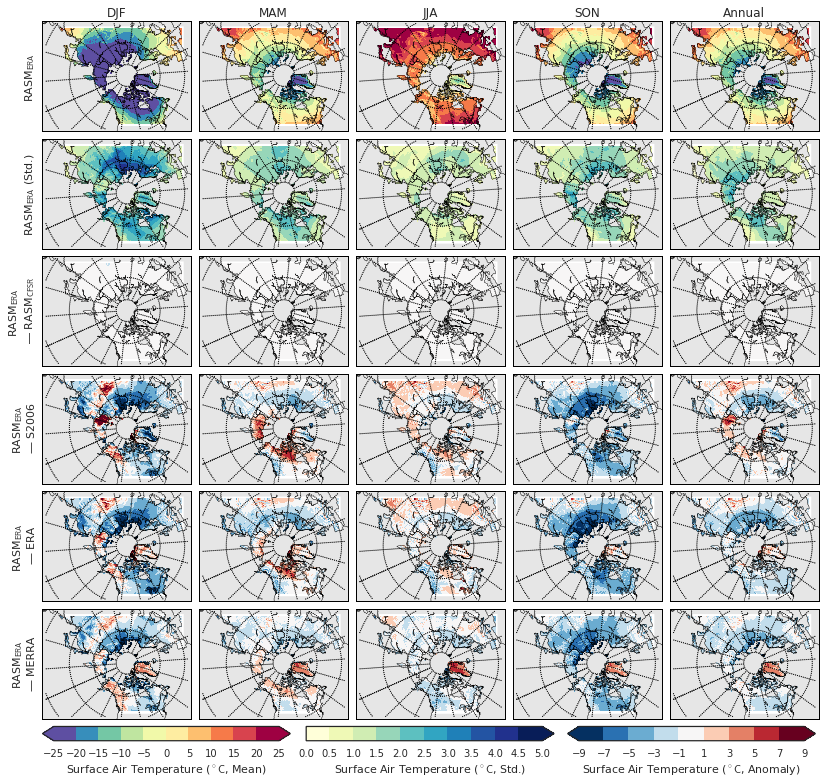

In [18]:
var = 'Tair'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['S2006'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts2'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, amin=-9, amax=9, smax=5, amap='RdBu_r',
                             varname='Surface Air Temperature', units='$^\circ C$')

fig.savefig('Fig2.png', dpi=600, bbox_inches='tight')

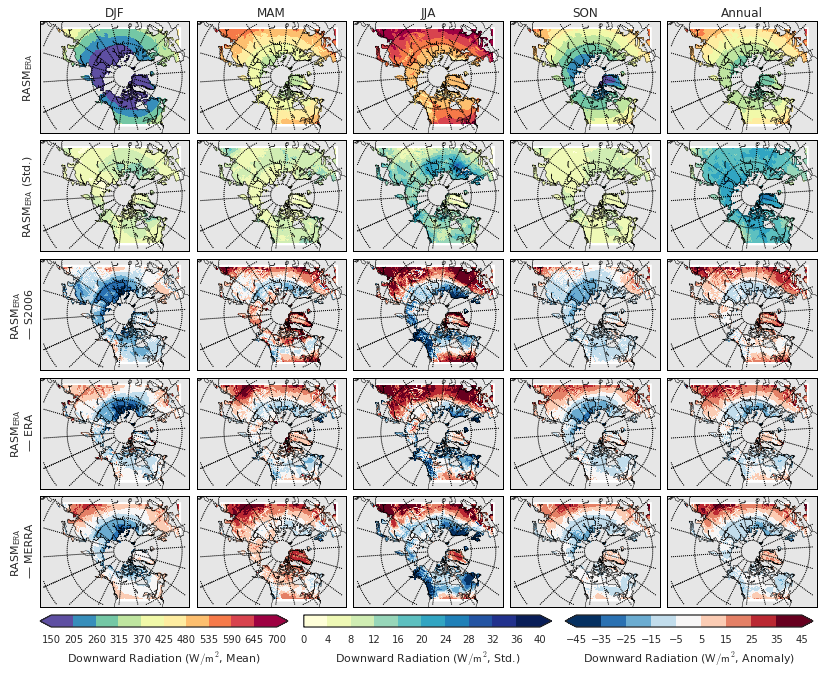

In [19]:
var = 'Radin'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['S2006'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=150, vmax=700, smax=40, amin=-45, amax=45, amap='RdBu_r',
                             varname='Downward Radiation', units='$W/m^2$')
fig.savefig('Fig4.png', dpi=600, bbox_inches='tight')

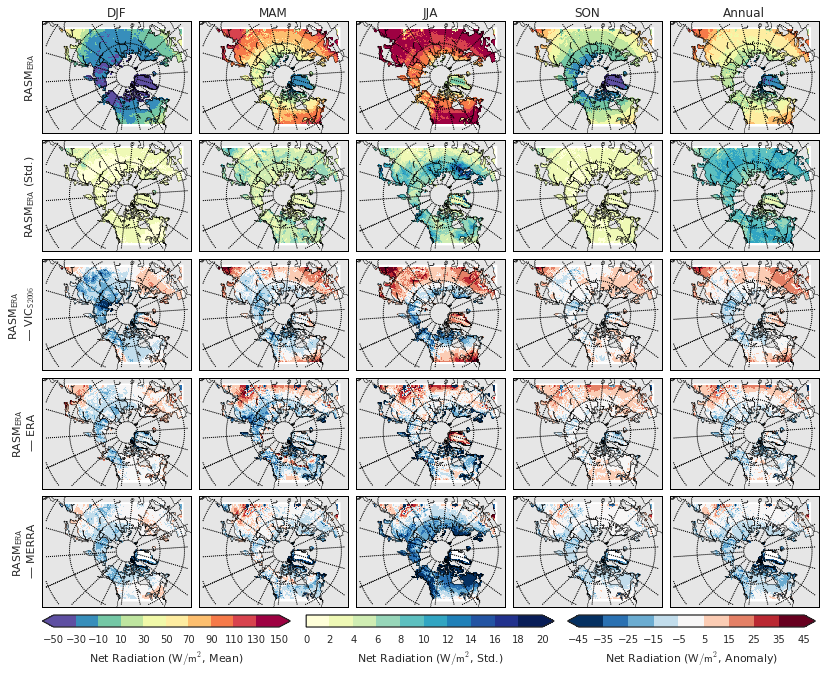

In [20]:
var = 'Radnet'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts1'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=-50, vmax=150, smax=20, amin=-45, amax=45, amap='RdBu_r',
                             varname='Net Radiation', units='$W/m^2$')
fig.savefig('Fig5.png', dpi=600, bbox_inches='tight')

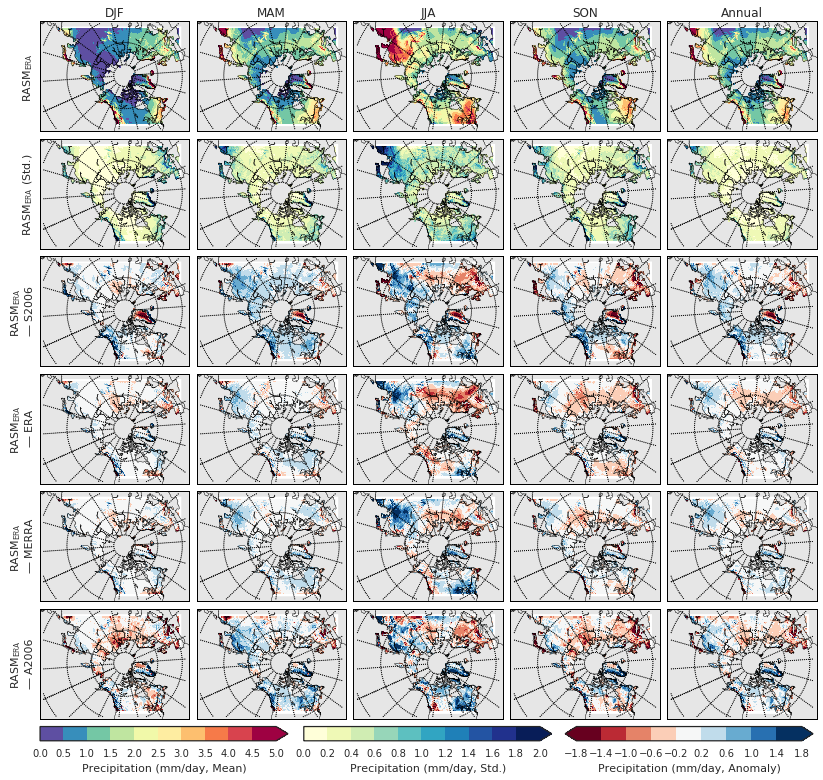

In [21]:
var = 'Precipitation'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['S2006'] = ncdata['sheffield_monthly_ts'][var].sel(time=slice(start, end)).squeeze()
monthly_means['ERA'] = ncdata['era_monthly_ts3'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['A2006'] = ncdata['adam_monthly_ts'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=0., vmax=5, smax=2, amin=-1.8, amax=1.8,
                             varname='Precipitation', units='mm/day', cbar_extend='max')
fig.savefig('Fig6.png', dpi=600, bbox_inches='tight')

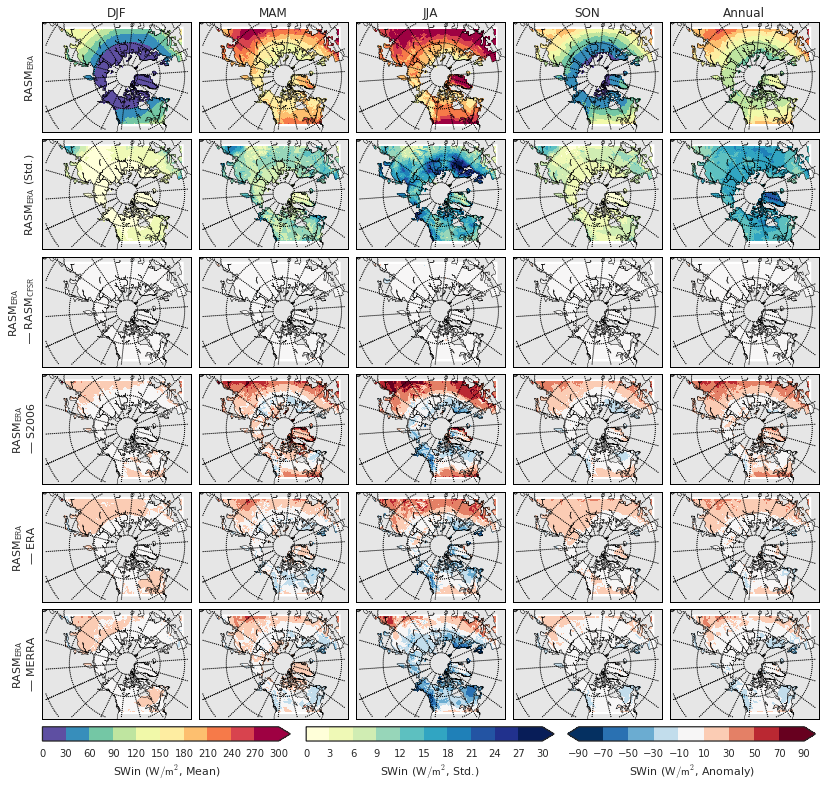

In [58]:
var = 'Swin'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['S2006'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=0., vmax=300, smax=30, amin=-90, amax=90, amap='RdBu_r',
                             varname='SWin', units='$W/m^2$', cbar_extend='max')

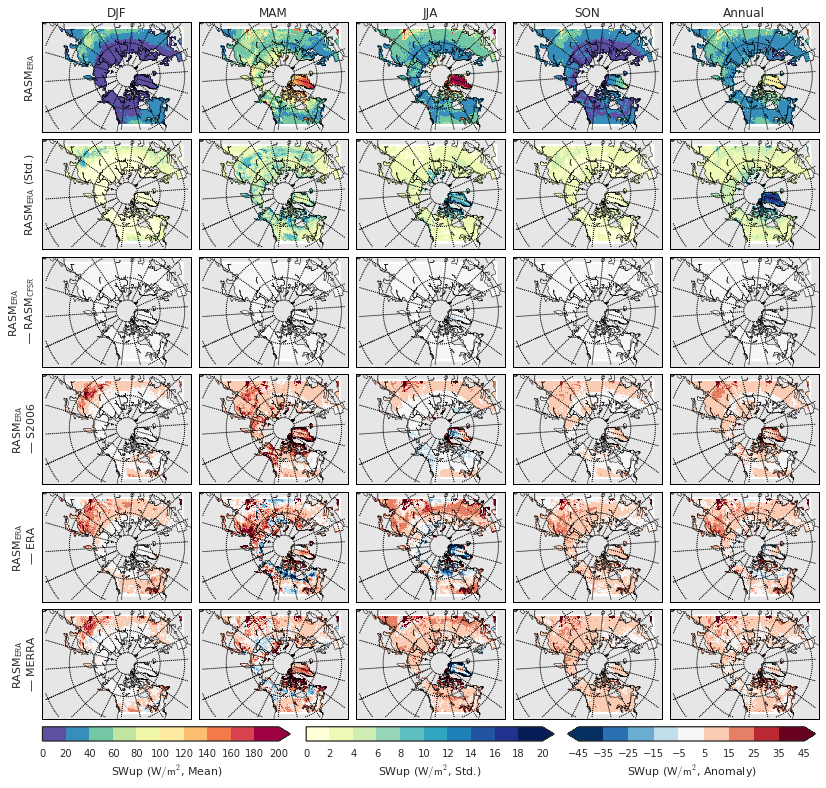

In [59]:
var = 'Swup'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['S2006'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=0., vmax=200, smax=20, amin=-45, amax=45, amap='RdBu_r',
                             varname='SWup', units='$W/m^2$', cbar_extend='max')

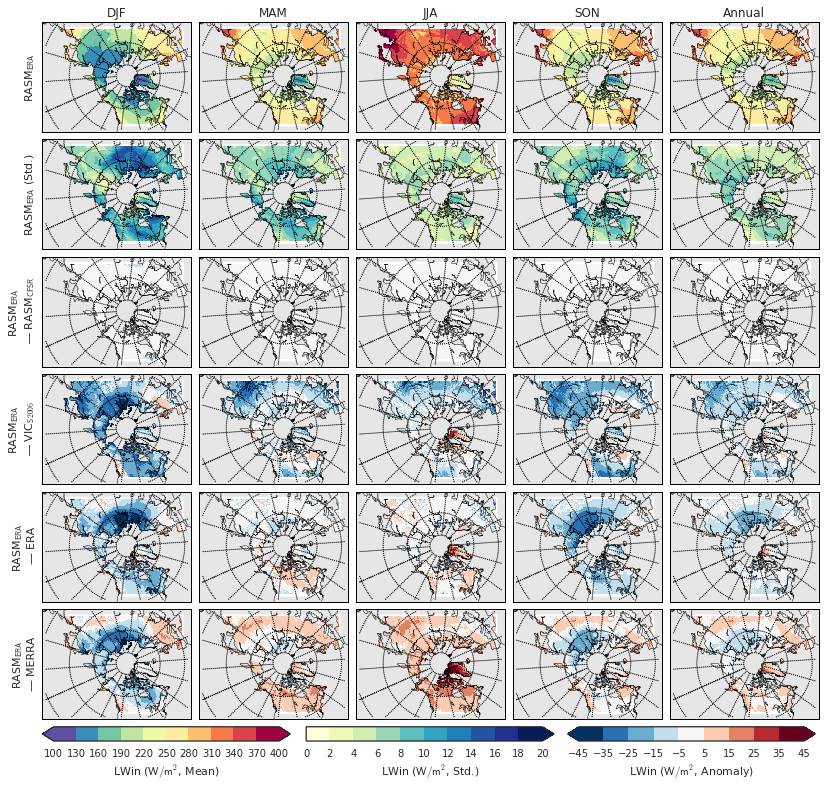

In [60]:
var = 'Lwin'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=100., vmax=400, smax=20, amin=-45, amax=45, amap='RdBu_r',
                             varname='LWin', units='$W/m^2$')

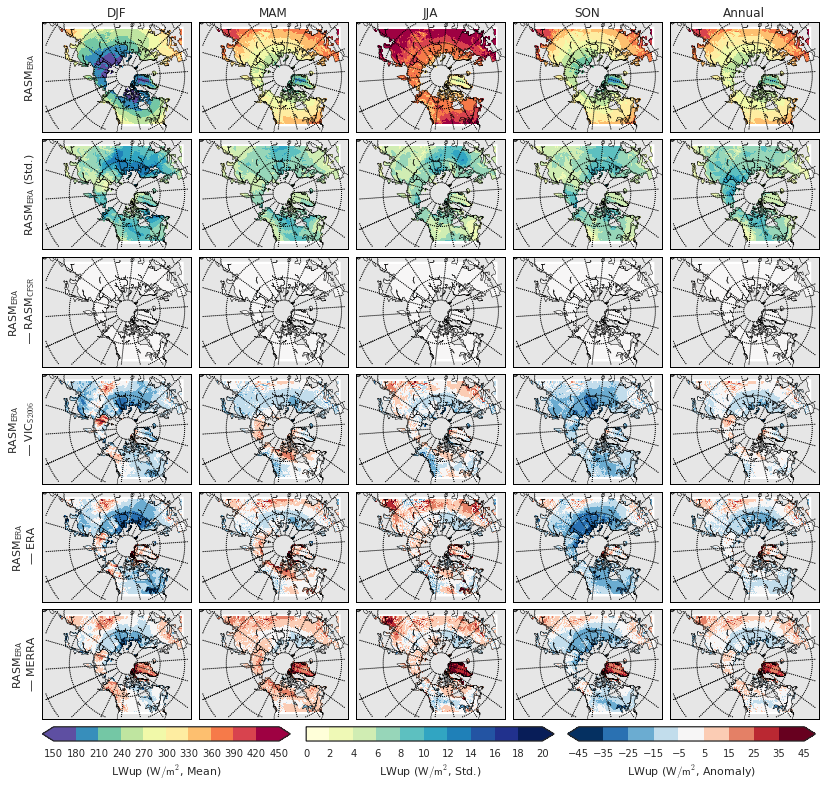

In [61]:
var = 'Lwup'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=150., vmax=450, smax=20, amin=-45, amax=45, amap='RdBu_r',
                             varname='LWup', units='$W/m^2$')

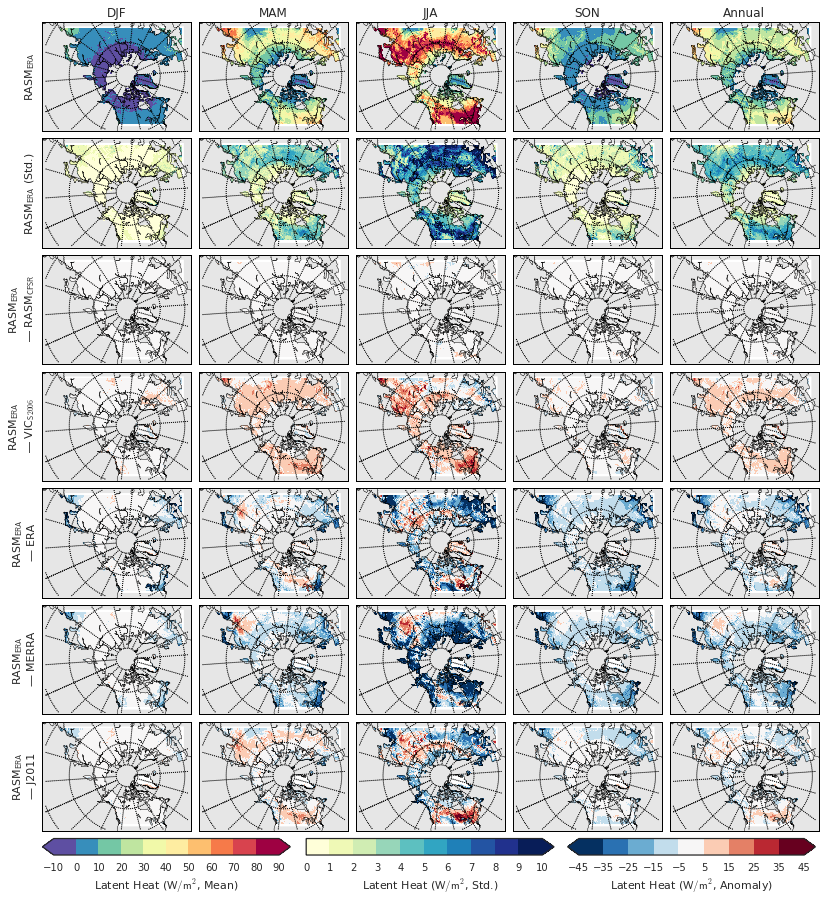

In [62]:
var = 'Latht'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['J2011'] = ncdata['gfluxnet_monthly_ts'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=-10., vmax=90, smax=10, amin=-45, amax=45, amap='RdBu_r',
                             varname='Latent Heat', units='$W/m^2$')

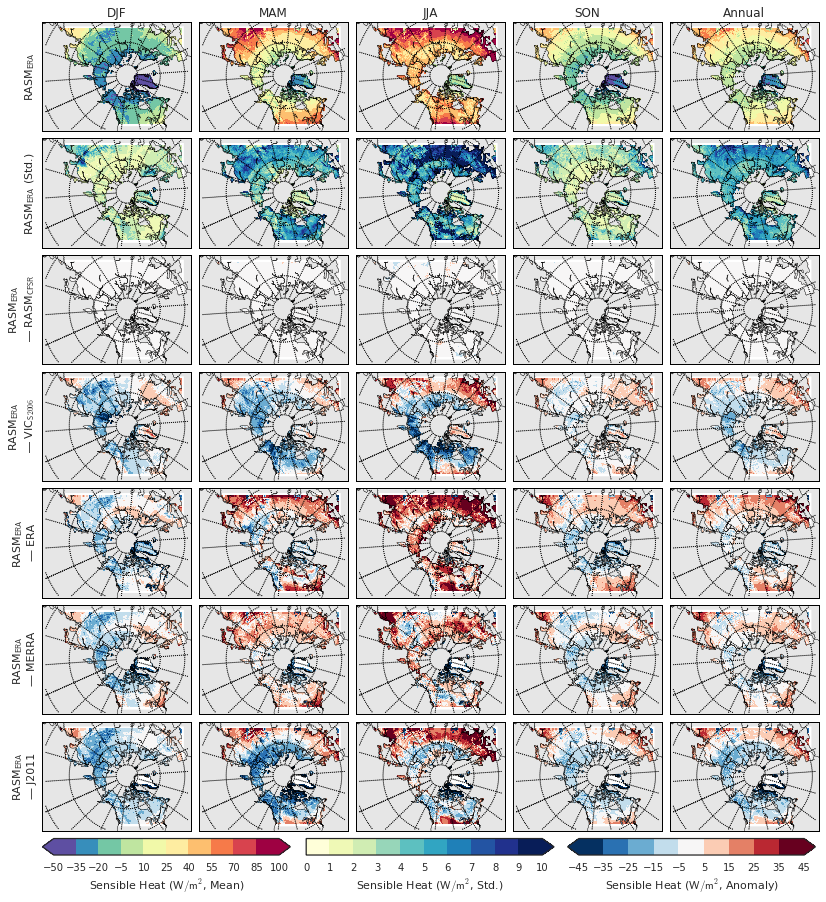

In [63]:
var = 'Senht'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts1'][var].sel(time=slice(start, end))
monthly_means['J2011'] = ncdata['gfluxnet_monthly_ts'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=-50., vmax=100, smax=10, amin=-45, amax=45, amap='RdBu_r',
                             varname='Sensible Heat', units='$W/m^2$')

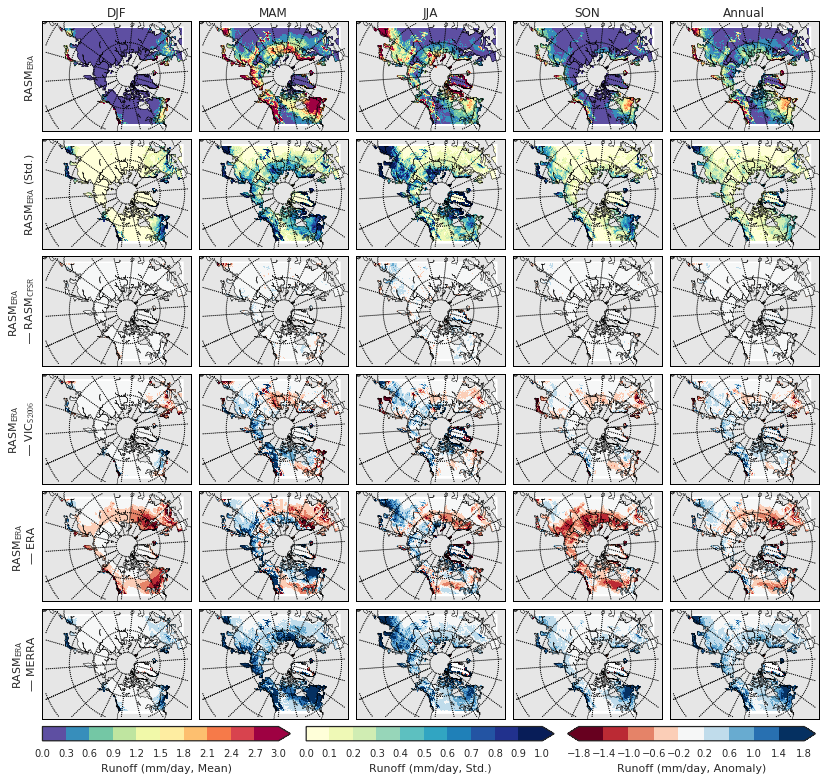

In [66]:
var = 'Runoff'
monthly_means = OrderedDict()
monthly_means['RASM$_{ERA}$'] = ncdata['rasm_era_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['RASM$_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['VIC$_{S2006}$'] = ncdata['rasm_offline_monthly_ts'][var].sel(time=slice(start, end))
monthly_means['ERA'] = ncdata['era_monthly_ts3'][var].sel(time=slice(start, end))
monthly_means['MERRA'] = ncdata['merra_monthly_ts1'][var].sel(time=slice(start, end))

fig, axes = plot_n_std_anoms(monthly_means, vmin=0., vmax=3, smax=1, amin=-1.8, amax=1.8,
                             varname='Runoff', units='mm/day', cbar_extend='max')

/home/jhamman/anaconda/envs/rasm/lib/python3.4/site-packages/matplotlib/figure.py:1744: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


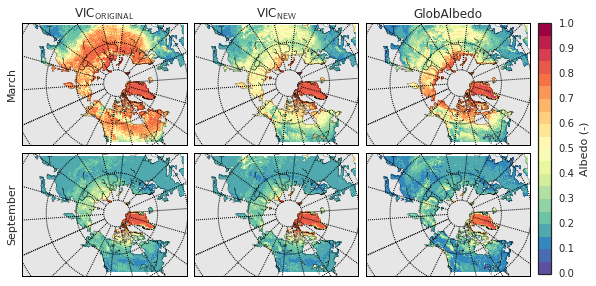

In [46]:
# plot albedo in march and august 1998-2007
data = OrderedDict()
start_date = '1998-01-01'
end_date = '2007-12-31'
data['VIC$_{ORIGINAL}$'] = ncdata['rasm_offline_alb_monthly_ts']['calc_albedo'].sel(time=slice(start_date, end_date)).groupby('time.month').mean('time')
data['VIC$_{NEW}$'] = ncdata['rasm_offline_monthly_ts']['calc_albedo'].sel(time=slice(start_date, end_date)).groupby('time.month').mean('time')
data['GlobAlbedo'] = ncdata['globalbedo_monthly_ts']['calc_albedo'].sel(time=slice(start_date, end_date)).groupby('time.month').mean('time')

cn = 20
vmin = 0.
vmax = 1
cmap = cmap_discretize('Spectral_r', n_colors=cn)
cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cticks = np.linspace(vmin, vmax, num=(cn) / 2 + 1)

months = [3, 9]

fig, axes = plt.subplots(nrows=len(months), ncols=len(data), figsize=(7.5, 4))

for i, month in enumerate(months):
    for j, (key, ds) in enumerate(data.items()):
        if j == 0:
            axes[i, j].set_ylabel(month_name[month])
        plt.sca(axes[i, j])
        wr50a_map.m.drawmapboundary(fill_color=fill_color)
        wr50a_map.m.fillcontinents(color='white', zorder=0)
        sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask,
                                           ds.sel(month=month).values),
                        ax=axes[i, j], cmap=cmap, vmin=vmin, vmax=vmax,
                        cbar=False, map_obj=wr50a_map,
                        units='',)
        if i == 0:
            axes[i, j].set_title(key)
            
ax1 = fig.add_axes([1., 0.05, 0.025, 0.87])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=cnorm,
                                orientation='vertical',
                                extend='neither',
                                ticks=cticks)
cb1.set_label('Albedo (-)')

plt.tight_layout()

plt.savefig('rasm1_plot_spatial_albedo_fix.png', dpi=dpi, bbox_inches='tight')
plt.savefig(os.path.join(os.environ['FTP'], 'RASM_land_surface_climate_figures', 'Figure_09.png'), dpi=dpi, bbox_inches='tight')

In [47]:
# bowen ratio (growing season)
season_means = OrderedDict()

season_means['RASM$_{ERA}$'] = (season_mean(ncdata['rasm_era_monthly_ts']['Senht'].sel(time=slice(start, end)), calendar='noleap') /
                                 season_mean(ncdata['rasm_era_monthly_ts']['Latht'].sel(time=slice(start, end)), calendar='noleap'))
season_means['VIC$_{S2006}$'] = (season_mean(ncdata['rasm_offline_monthly_ts']['Senht'].sel(time=slice(start, end)), calendar='noleap') /
                                  season_mean(ncdata['rasm_offline_monthly_ts']['Latht'].sel(time=slice(start, end)), calendar='noleap'))
season_means['ERA'] = (season_mean(ncdata['era_monthly_ts1']['Senht'].sel(time=slice(start, end)), calendar='standard') /
                        season_mean(ncdata['era_monthly_ts1']['Latht'].sel(time=slice(start, end)), calendar='standard'))
season_means['MERRA'] = (season_mean(ncdata['merra_monthly_ts1']['Senht'].sel(time=slice(start, end)), calendar='standard') /
                            season_mean(ncdata['merra_monthly_ts1']['Latht'].sel(time=slice(start, end)), calendar='standard'))
season_means['J2011'] = (season_mean(ncdata['gfluxnet_monthly_ts']['Senht'].sel(time=slice(start, end)), calendar='standard') /
                              season_mean(ncdata['gfluxnet_monthly_ts']['Latht'].sel(time=slice(start, end)), calendar='standard'))

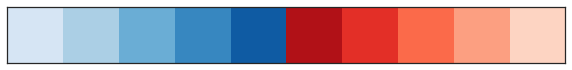

In [48]:
colors = np.append(sns.color_palette("Blues", n_colors=5), sns.color_palette("Reds_r", n_colors=5), axis=0)
sns.palplot(colors)

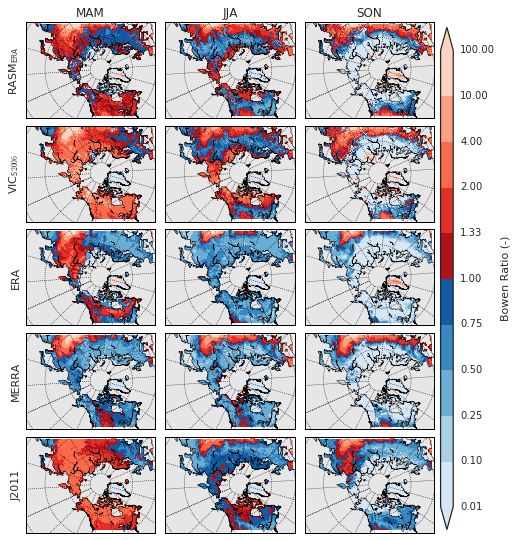

In [49]:
growing_seasons = ['MAM', 'JJA', 'SON']
vmin = 0
vmax = 10

cmap = 'Spectral_r'

ticks = [0.01, 0.1, 0.25, 0.5, 0.75, 1, 1/0.75, 1/0.5, 1/0.25, 1/0.1, 100]
# cmap = cmap_discretize_2(cmap, len(ticks))

cmap = mpl.colors.ListedColormap(colors)
norm = mpl.colors.BoundaryNorm(ticks, cmap.N)

sns.set_style("white")
fig, axes = plt.subplots(ncols=3, nrows=len(season_means), figsize=(7, 7.5))

for i, (name, ds) in enumerate(season_means.items()):
    
    for j, season in enumerate(growing_seasons):
        
        ax = axes[i, j]
        plt.sca(ax)
        
        data = ds.sel(season=season).values.squeeze()
        #         sub_plot_pcolor(np.ma.masked_where(spatial_plot_mask, data),
        #                 map_obj=wr50a_map,
        #                 cbar=None, cmap=cmap)
        wr50a_map.m.drawmapboundary(fill_color=fill_color)
        wr50a_map.m.fillcontinents(color='white', zorder=0)
        wr50a_map.m.pcolormesh(wr50a_map.xi, wr50a_map.yi, np.ma.masked_where(spatial_plot_mask, data),
                               cmap=cmap, norm=norm)
        #         wr50a_map.m.contour(wr50a_map.xi, wr50a_map.yi, data, [1], colors='k', lw=0.5)
        wr50a_map.m.drawparallels(np.arange(-80., 81., 20.), linewidth=0.5)
        wr50a_map.m.drawmeridians(np.arange(-180., 181., 20.), linewidth=0.5)
        wr50a_map.m.drawcoastlines(color='k', linewidth=0.5)

        if j == 0:
            ax.set_ylabel(name)
        if i == 0:
            ax.set_title(season)
            

plt.tight_layout(w_pad=0)

fig.subplots_adjust(right=0.85, wspace=0.05 )

ax1 = fig.add_axes([0.86, 0.02, 0.025, 0.93])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap, norm=norm,
                                orientation='vertical',
                                extend='both',
                                ticks=ticks,
                                format='%.2f')
cb1.set_label('Bowen Ratio (-)')

plt.savefig('rasm1_plot_spatial_bowen.png', dpi=dpi, bbox_inches='tight')
plt.savefig(os.path.join(os.environ['FTP'], 'RASM_land_surface_climate_figures', 'Figure_10.png'), dpi=dpi, bbox_inches='tight')

Figure 11:	Basin streamflow statistics (bar graph of P/E/Q/dS components),  Scatter plot of annual streamflow statistics using R-Arctic net

In [50]:
ncdata['era_monthly_ts3'] = ncdata['era_monthly_ts3'].reindex_like(ncdata['era_monthly_ts2'], method='nearest')

In [52]:
datasets = OrderedDict()
datasets['$ERA$'] = ncdata['era_monthly_ts1'][['calc_albedo', 'Swnet', 'Lwnet', 'Latht', 'Senht',
                                            'bowen_ratio', 'Swin', 'Swup']].sel(time=slice(start, end))
datasets['$ERA$']['Tair'] = ncdata['era_monthly_ts2']['Tair'].sel(time=slice(start, end))
for var in ['Precipitation', 'Evap', 'runoff_ratio', 'runoff_tot', 'P-E']:
    datasets['$ERA$'][var] = ncdata['era_monthly_ts3'][var].sel(time=slice(start, end))

datasets['$MERRA$'] = ncdata['merra_monthly_ts1'][['Swnet', 'Lwnet', 'Latht', 'Senht', 'bowen_ratio',
                                                'Precipitation', 'Evap', 'runoff_ratio', 'runoff_tot', 'P-E']].sel(time=slice(start, end))
for var in ['calc_albedo', 'Tair', 'Swin', 'Swup']:
    datasets['$MERRA$'][var] = ncdata['merra_monthly_ts2'][var].sel(time=slice(start, end))
    
    
datasets['$RASM_{ERA}$'] = ncdata['rasm_era_monthly_ts'][['Tair', 'calc_albedo', 'Swnet', 'Lwnet', 'Latht', 'Senht', 'bowen_ratio',
                                                     'Precipitation', 'Evap', 'runoff_ratio', 'Swin', 'Swup', 'runoff_tot', 'P-E']].sel(time=slice(start, end))
datasets['$RASM_{CFSR}$'] = ncdata['rasm_cfsr_monthly_ts'][['Tair', 'calc_albedo', 'Swnet', 'Lwnet', 'Latht', 'Senht', 'bowen_ratio',
                                                     'Precipitation', 'Evap', 'runoff_ratio', 'Swin', 'Swup', 'runoff_tot', 'P-E']].sel(time=slice(start, end))

# summary tables

variables = ['calc_albedo', 'Swnet', 'Lwnet', 'Latht', 'Senht', 'bowen_ratio', 'Tair', 'Precipitation', 'Evap', 'runoff_ratio', 'runoff_tot', 'Swin', 'Swup', 'P-E']

mask_keys = ['mask_boreal_forests_taiga', 'mask_tundra']

In [53]:
mask_dict = {}

for mask_name in mask_keys:
    # get ys, xs, and inidvidual grid cell weights
    mask = ncdata['rasm_masks'][mask_name].values
    mask = mask.clip(0, ncdata['rasm_masks']['mask_active_land'].values)
    ys, xs = np.nonzero(mask)
    weights = (mask[ys, xs] * ncdata['rasm_domain']['area'].values[ys, xs])
    weights /= weights.sum()
    ds_dict = {}
    for ds_name, ds in datasets.items():
        ds_seas_means = season_mean(ds, calendar=calendars[ds_name])
        ds_annu_means = annual_mean(ds, calendar=calendars[ds_name])
        # calc a few quantities that often get nans in them at the monthly timescale
        ds_seas_means['runoff_ratio'] = ds_seas_means['runoff_tot'] / ds_seas_means['Precipitation']
        ds_seas_means['bowen_ratio'] = ds_seas_means['Senht'] / ds_seas_means['Latht']  
        ds_seas_means['calc_albedo'] = ds_seas_means['Swup'] / ds_seas_means['Swin']  
        ds_annu_means['runoff_ratio'] = ds_annu_means['runoff_tot'] / ds_annu_means['Precipitation']
        ds_annu_means['bowen_ratio'] = ds_annu_means['Senht'] / ds_annu_means['Latht']
        ds_annu_means['calc_albedo'] = ds_annu_means['Swup'] / ds_annu_means['Swin']  
        
        var_dict = {}
        for var_name in variables:
            means = []
            for season in seasons:
                temp = ds_seas_means.sel(season=season)[var_name].values[ys, xs] * weights
                temp[np.isinf(temp)] = np.nan
                temp[~np.isfinite(temp)] = np.nan
                mean = np.nansum(temp)
                means.append(mean)
            mean = np.nansum(ds_annu_means[var_name].values[ys, xs] * weights)
            means.append(mean)
            var_dict[var_name] = means
        ds_dict[ds_name] = var_dict
    mask_dict[mask_name] = ds_dict

In [54]:
index = list(seasons)
index.append('Annual')
print(index)

# rearrage dict
frames = OrderedDict()
mask_dict2 = OrderedDict()
mask_frames = []
for mask in mask_keys:
    frames[mask] = []
    mask_dict2[mask] = OrderedDict()
    var_frames = []
    for var in variables:
        mask_dict2[mask][var] = OrderedDict()
        for ds_name in datasets:
            mask_dict2[mask][var][ds_name] = OrderedDict()
            for i, t in enumerate(index):
                mask_dict2[mask][var][ds_name][t] = mask_dict[mask][ds_name][var][i]
        var_frames.append(pd.DataFrame.from_dict(mask_dict2[mask][var], orient='index'))
    mask_frames.append(pd.concat(var_frames, keys=variables))
table = pd.concat(mask_frames, keys=mask_keys)

['DJF', 'MAM', 'JJA', 'SON', 'Annual']


In [55]:
table.to_csv('rasm1_land_surface_paper_summary.csv')
table

DJF         MAM  \
mask_boreal_forests_taiga calc_albedo   $ERA$           0.299602    0.260580   
                                        $MERRA$         0.472112    0.296671   
                                        $RASM_{CFSR}$   0.438523    0.324331   
                                        $RASM_{ERA}$    0.437476    0.320226   
                          Swnet         $ERA$          18.049911  129.788908   
                                        $MERRA$        14.132135  121.240517   
                                        $RASM_{CFSR}$  19.117052  114.794600   
                                        $RASM_{ERA}$   19.382419  116.148938   
                          Lwnet         $ERA$         -32.739196  -56.804164   
                                        $MERRA$       -28.906860  -54.303447   
                                        $RASM_{CFSR}$ -39.522166  -53.290559   
                                        $RASM_{ERA}$  -39.568519  -53.885729   
                          Latht         $ERA$           2.084746   24.724369   
                                        $MERRA$         2.463103   33.937368   
                                        $RASM_{CFSR}$   0.443281   24.405053   
                                        $RASM_{ERA}$    0.472052   24.908854   
                          Senht         $ERA$         -13.763989   29.016189   
                                        $MERRA$       -11.781369   20.578370   
                                        $RASM_{CFSR}$ -17.717507   28.488475   
                                        $RASM_{ERA}$  -17.500441   28.757963   
                          bowen_ratio   $ERA$           2.818485    1.204798   
                                        $MERRA$       -48.056495    0.597507   
                                        $RASM_{CFSR}$  -8.998533    1.137550   
                                        $RASM_{ERA}$   14.274650    1.129752   
                          Tair          $ERA$         -20.356489   -2.883499   
                                        $MERRA$       -21.585931   -3.999109   
                                        $RASM_{CFSR}$ -23.282713   -4.457316   
                                        $RASM_{ERA}$  -23.386305   -4.281379   
                          Precipitation $ERA$           0.962791    1.312913   
                                        $MERRA$         0.939443    1.327350   
...                                                          ...         ...   
mask_tundra               Tair          $RASM_{CFSR}$ -28.490417  -12.077893   
                                        $RASM_{ERA}$  -28.389855  -11.899124   
                          Precipitation $ERA$           0.797724    0.910988   
                                        $MERRA$         0.834147    0.941372   
                                        $RASM_{CFSR}$   0.819087    1.024896   
                                        $RASM_{ERA}$    0.807530    1.023457   
                          Evap          $ERA$           0.068869    0.334635   
                                        $MERRA$         0.002418    0.477338   
                                        $RASM_{CFSR}$  -0.022575    0.289166   
                                        $RASM_{ERA}$   -0.022593    0.291660   
                          runoff_ratio  $ERA$           0.182614    0.950303   
                                        $MERRA$         0.044557    0.593920   
                                        $RASM_{CFSR}$   0.033315    1.383315   
                                        $RASM_{ERA}$    0.034146    1.423321   
                          runoff_tot    $ERA$           0.214990    0.868843   
                                        $MERRA$         0.091879    0.718196   
                                        $RASM_{CFSR}$   0.092806    1.493265   
                                        $RASM_{ERA}$    0.089634    1.525000   
                          Swin          $ERA$           8.987

In [56]:
pd.set_option('display.precision', 3)
pd.set_option('display.max_rows', 150)
table

DJF      MAM  \
mask_boreal_forests_taiga calc_albedo   $ERA$            0.300    0.261   
                                        $MERRA$          0.472    0.297   
                                        $RASM_{CFSR}$    0.439    0.324   
                                        $RASM_{ERA}$     0.437    0.320   
                          Swnet         $ERA$           18.050  129.789   
                                        $MERRA$         14.132  121.241   
                                        $RASM_{CFSR}$   19.117  114.795   
                                        $RASM_{ERA}$    19.382  116.149   
                          Lwnet         $ERA$          -32.739  -56.804   
                                        $MERRA$        -28.907  -54.303   
                                        $RASM_{CFSR}$  -39.522  -53.291   
                                        $RASM_{ERA}$   -39.569  -53.886   
                          Latht         $ERA$            2.085   24.724   
                                        $MERRA$          2.463   33.937   
                                        $RASM_{CFSR}$    0.443   24.405   
                                        $RASM_{ERA}$     0.472   24.909   
                          Senht         $ERA$          -13.764   29.016   
                                        $MERRA$        -11.781   20.578   
                                        $RASM_{CFSR}$  -17.718   28.488   
                                        $RASM_{ERA}$   -17.500   28.758   
                          bowen_ratio   $ERA$            2.818    1.205   
                                        $MERRA$        -48.056    0.598   
                                        $RASM_{CFSR}$   -8.999    1.138   
                                        $RASM_{ERA}$    14.275    1.130   
                          Tair          $ERA$          -20.356   -2.883   
                                        $MERRA$        -21.586   -3.999   
                                        $RASM_{CFSR}$  -23.283   -4.457   
                                        $RASM_{ERA}$   -23.386   -4.281   
                          Precipitation $ERA$            0.963    1.313   
                                        $MERRA$          0.939    1.327   
                                        $RASM_{CFSR}$    0.982    1.442   
                                        $RASM_{ERA}$     0.970    1.442   
                          Evap          $ERA$            0.065    0.821   
                                        $MERRA$          0.076    1.144   
                                        $RASM_{CFSR}$    0.014    0.819   
                                        $RASM_{ERA}$     0.015    0.837   
                          runoff_ratio  $ERA$            0.518    0.927   
                                        $MERRA$          0.058    0.486   
                                        $RASM_{CFSR}$    0.064    0.981   
                                        $RASM_{ERA}$     0.066    0.982   
                          runoff_tot    $ERA$            0.551    1.175   
                                        $MERRA$          0.103    0.761   
                                        $RASM_{CFSR}$    0.127    1.510   
                                        $RASM_{ERA}$     0.128    1.510   
                          Swin          $ERA$           25.373  175.492   
                                        $MERRA$         26.218  172.982   
                                        $RASM_{CFSR}$   33.223  169.299   
                                        $RASM_{ERA}$    33.628  170.280   
                          Swup          $ERA$            7.323   45.704   
                                        $MERRA$         11.714   50.675   
                                        $RASM_{CFSR}$   14.106   54.504   
                                        $RASM_{ERA}$    14.245   54.131   
                          P-E           $ERA$            0.898    0.492   
         